<a href="https://colab.research.google.com/github/Dimildizio/DS_course/blob/main/Neural_networks/Multimodal/nano_banana.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import os, base64, requests, json, re
from google.colab import userdata
from IPython.display import Image, display


OPENROUTER_API_KEY = userdata.get('openrouter')
NANO_BANANA = "google/gemini-2.5-flash-image-preview:free"
URL = "https://openrouter.ai/api/v1/chat/completions"

headers = {"Authorization": f"Bearer {OPENROUTER_API_KEY}",
           "Content-Type": "application/json"}

In [2]:
def encode_to_data_url(path: str) -> str:
    ext = path.lower().split(".")[-1]
    mime = {"png": "image/png", "jpg": "image/jpeg", "jpeg": "image/jpeg", "webp": "image/webp"}.get(ext, "image/png")
    with open(path, "rb") as f:
        b64 = base64.b64encode(f.read()).decode("utf-8")
    return f"data:{mime};base64,{b64}"

In [16]:
def create_payload(prompt, img1_data, img2_data, model=NANO_BANANA):
  messages = [
      {"role": "user",
          "content": [
              {"type": "text", "text": prompt_text}, # text first, then images
              {"type": "image_url", "image_url": {"url": img1_data}},  # source
              #{"type": "image_url", "image_url": {"url": img2_data}},  # destination
          ]}]

  payload = {"model": model,
            "messages": messages,
            "modalities": ["image", "text"]}
  return payload

def show_data_url(data_url: str):
    m = re.match(r"^data:image/\w+;base64,(.*)$", data_url)
    b64 = m.group(1) if m else data_url
    img_bytes = base64.b64decode(b64)
    return img_bytes

In [15]:
image_path_1 = "me.png"  # source person
image_path_2 = "bros2.png"  # source background

img1_data_url = encode_to_data_url(image_path_1)
img2_data_url = encode_to_data_url(image_path_2)

prompt_text = "Take the person from image 1 and add to image 2. Make his outfit match the style of others in image 2. Match lighting, style and perspective of image 2; seamless, photorealistic inpainting."

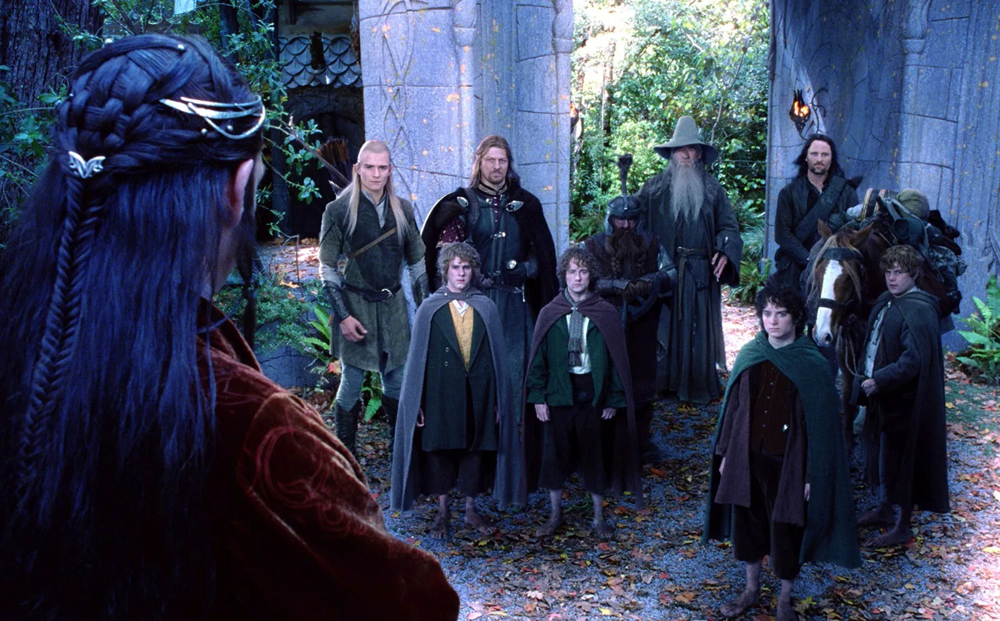

In [83]:
display(Image(data=image_path_2, width=800))

In [ ]:
payload = create_payload(prompt_text, img1_data_url, img2_data_url)
resp = requests.post(URL, headers=headers, json=payload, timeout=300)
resp.raise_for_status()
data = resp.json()
print(data)
if not data.get("choices"):
    raise RuntimeError(f"No choices in response")

msg = data["choices"][0].get("message", {})
images = msg.get("images") or []

if not images:
    raise RuntimeError(f"No images returned.")

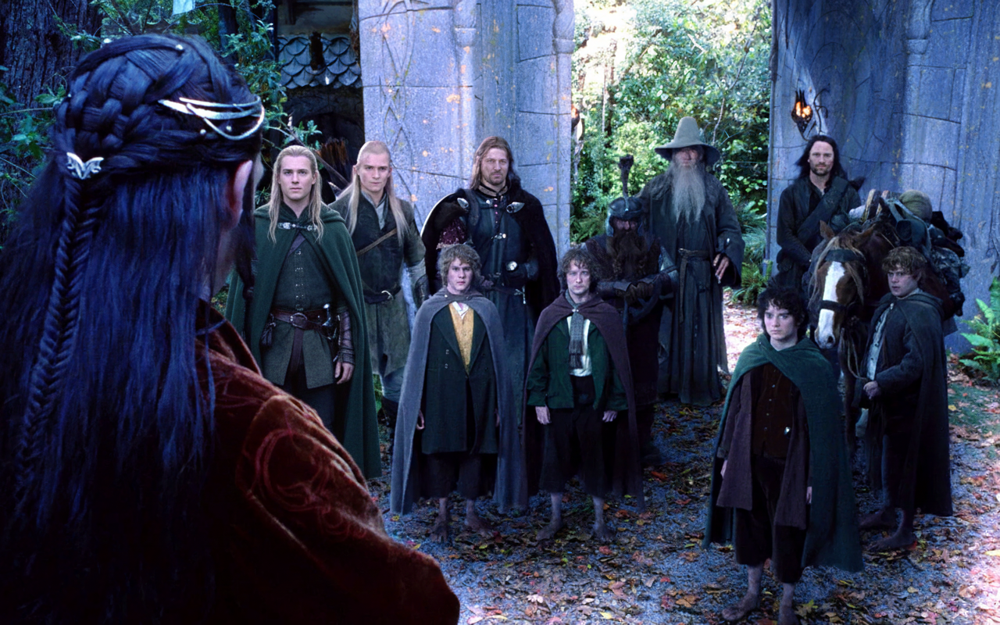

In [79]:
new_image_bytes = show_data_url(images[0]["image_url"]["url"])
display(Image(data=new_image_bytes, width=1200))

In [18]:
prompt_text = "Put the characters on the image on beach of a tropical island"

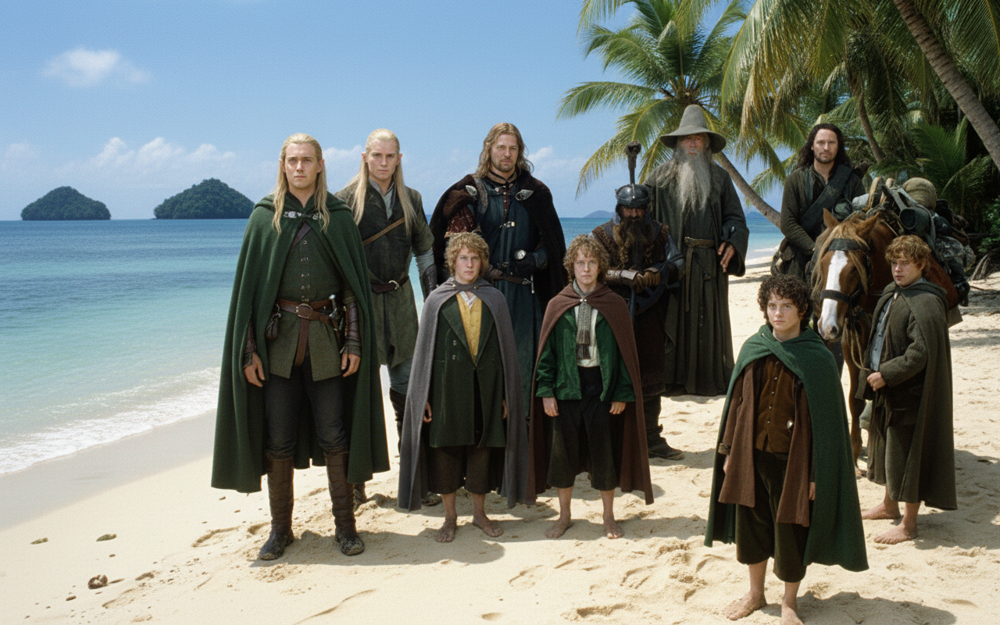

In [23]:
new_image_bytes = show_data_url(images[0]["image_url"]["url"])
display(Image(data=new_image_bytes, width=1200))

In [36]:
prompt_text = "Make the characters wear appropriate for a beach leisure attire - swimming trunks, rubber ducks and other things and clothes for water sports and sunbathing. They shouldn't wear capes, only beach clothes"

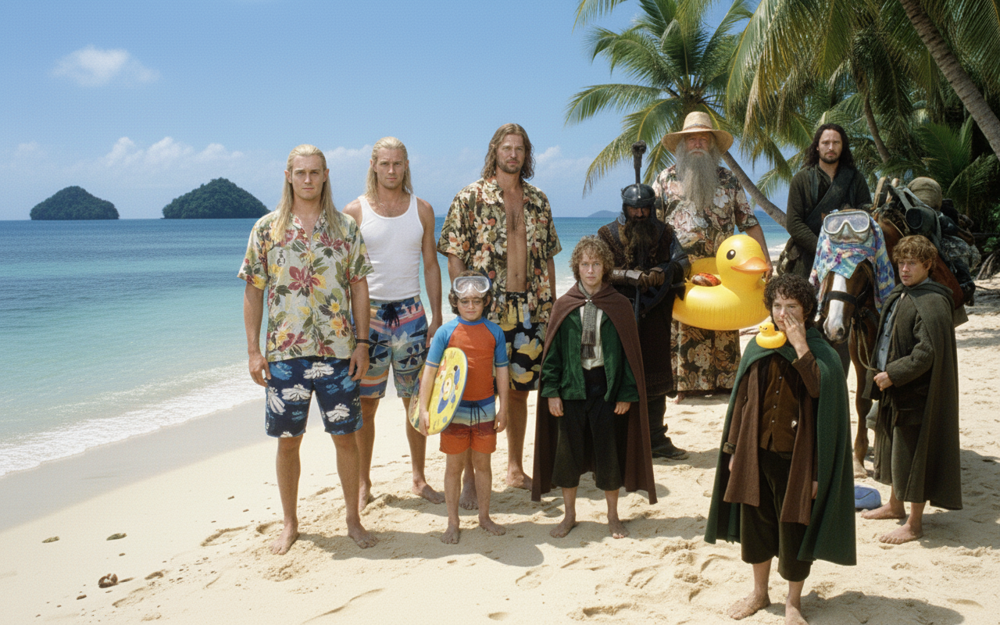

In [38]:
new_image_bytes = show_data_url(images[0]["image_url"]["url"])
display(Image(data=new_image_bytes, width=1200))

In [44]:
prompt_text = "Orks! Numerous orks are attacking from behind! And on boats too!"

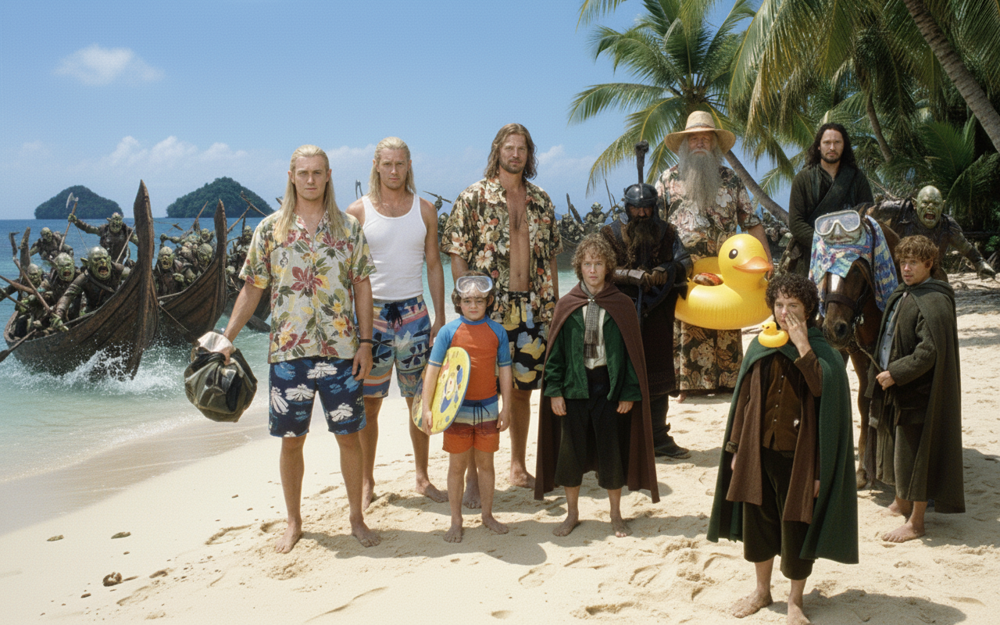

In [45]:
new_image_bytes = show_data_url(images[0]["image_url"]["url"])
display(Image(data=new_image_bytes, width=1200))

In [70]:
prompt_text = "The orks are carrying flowers instead of weapons! Each ork has one flower!"

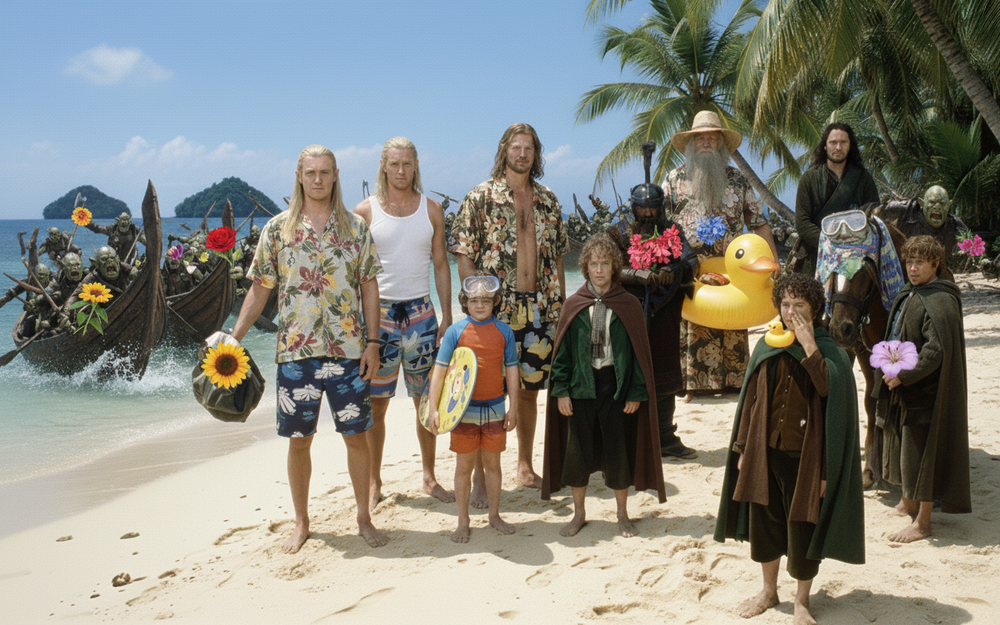

In [72]:
new_image_bytes = show_data_url(images[0]["image_url"]["url"])
display(Image(data=new_image_bytes, width=1200))